In [2]:
# Import Plot.ly functions for both online/offline
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

# Import extra modules as needed
import numpy as np

from dataChest import dataChest

init_notebook_mode()

from probeStationAnalysis import probeTest

# 130C hot plate at a range of times - No Ozone #

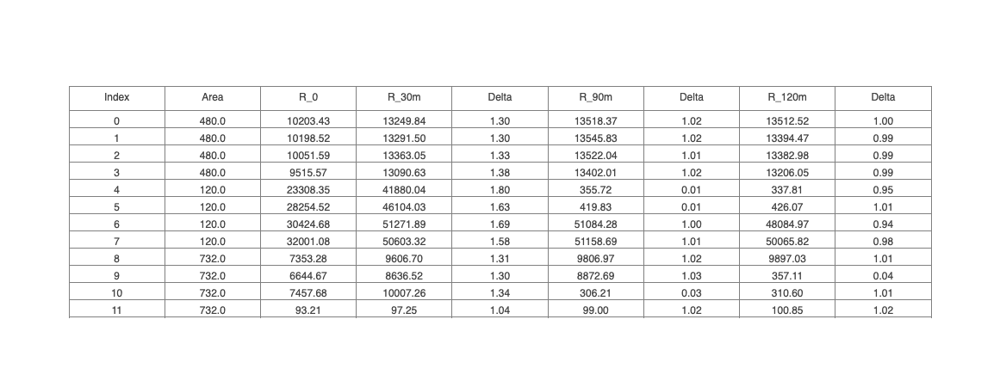

In [13]:
files = ['cgj2134cby_CW20111211B-Ox7-2-preBake.hdf5', 'cgj2335fjj_CW20111211B-Ox7-2-postBake-0.5hours.hdf5', 'cgk1947qpe_CW20111211B-Ox7-2-postBake-1hour.hdf5','cgl0006bgy_CW20111211B-Ox7-2-postBake-2hours.hdf5']
minutesBaked = [0, 30, 30+60, 30+60+120]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][30], row['r'][30]/row['r'][0], 
                                   row['r'][90], row['r'][90]/row['r'][30], 
                                   row['r'][210], row['r'][210]/row['r'][90]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_30m', 'Delta', 'R_90m', 'Delta', 'R_120m', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Clean room vacuum oven (1T N2, 130C) - No Ozone #

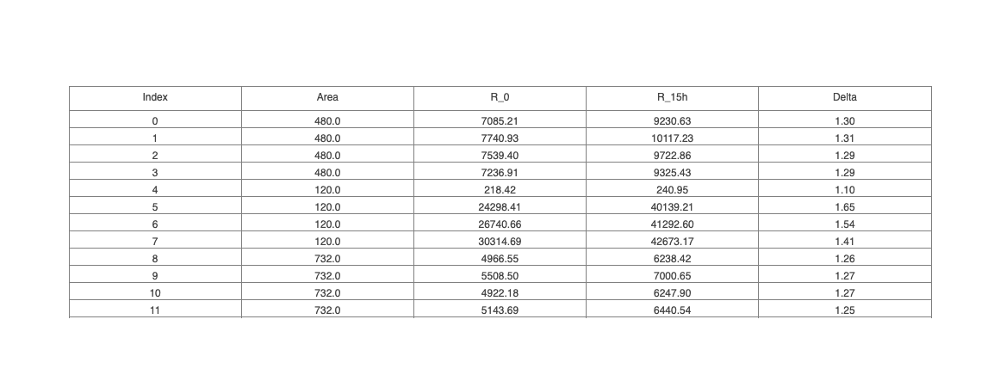

In [14]:
files = ['che2058clv_CW20181211B-Ox9-3-preBake-LowVac15h130C.hdf5', 'chf1519hhu_CW20181211B-Ox9-3-postBake-LowVac15h130C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Overnight Bake in Eom Vacuum Oven ($10^{-5}$T, 170C) - No Ozone #

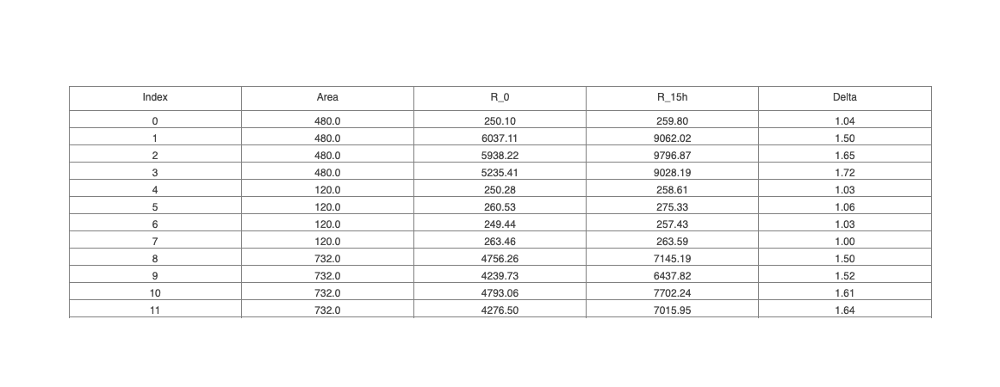

In [9]:
files = ['chf2158eqp_CW20181211B-Ox9-1-preBake-HighVac15h170C.hdf5', 'chh1754olv_CW20181211B-Ox9-1-postBake-HighVac15h170C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Overnight Bake in Eom Vacuum Oven ($10^{-5}$T, 130C) - Ozone #

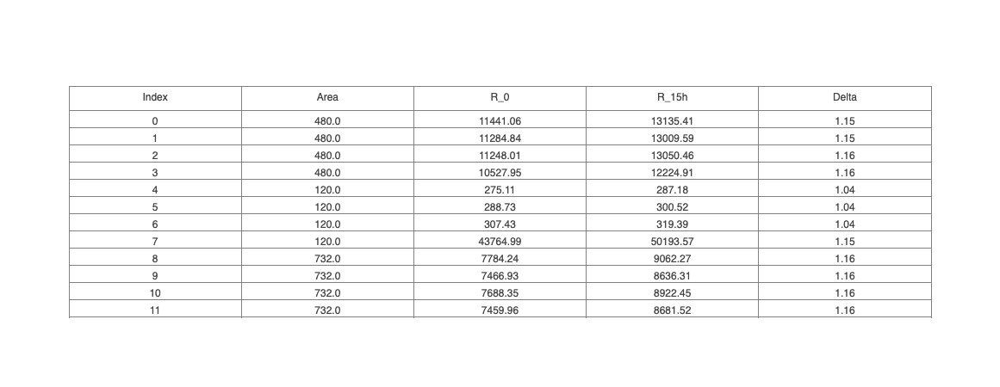

In [21]:
files = ['chk2105kdh_CW20181211B-Ox7-1-preBake-Oz-HighVac15h130C.hdf5', 'chl1725ast_CW20181211B-Ox7-1-postBake-Oz-HighVac15h130C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Overnight Bake in Eom Vacuum Oven ($10^{-5}$T, 170C) - Ozone #

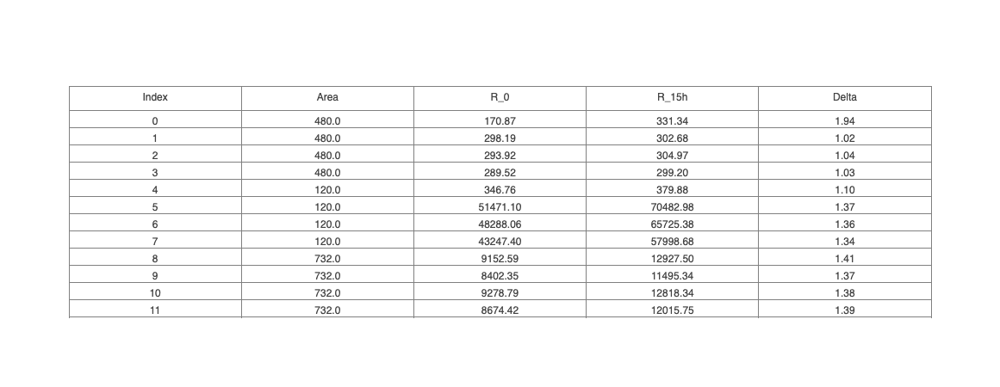

In [10]:
files = ['chf2219hkz_CW20181211B-Ox6-1-preBake-Oz-HighVac15h170C.hdf5', 'chh1817xgg_CW20181211B-Ox6-1-postBake-Oz-HighVac15h170C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Spinner Hot Plate Bake 170C 20m - Ozone #

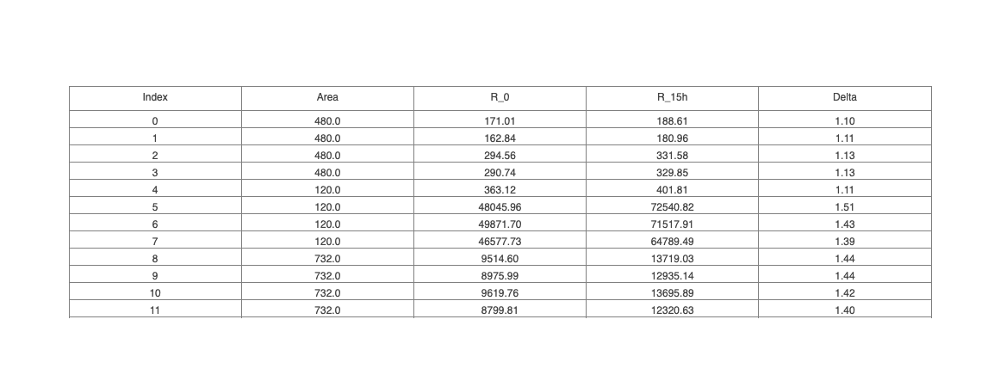

In [11]:
files = ['chf2226qux_CW20181211B-Ox6-2-preBake-Oz-Hotplate20m170C.hdf5', 'chh1825dlg_CW20181211B-Ox6-2-postBake-Oz-Hotplate20m170C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Spinner Hot Plate Bake 170C 20m with MMA/PMMA - Ozone #

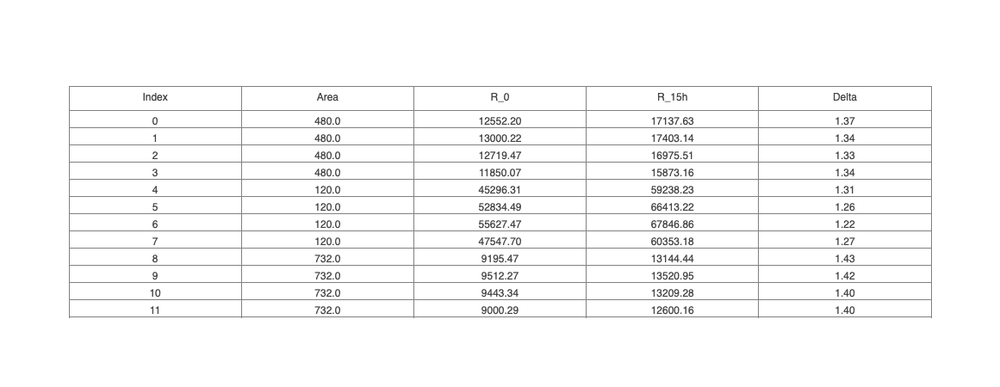

In [15]:
files = ['chf2233kxo_CW20181211B-Ox6-3-preBake-Oz-HotplateMmaPmma20m170C.hdf5', 'chh1909pal_CW20181211B-Ox6-3-postBake-Oz-HotplateMmaPmma20m170C.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Ion mill with 955 - Ozone #

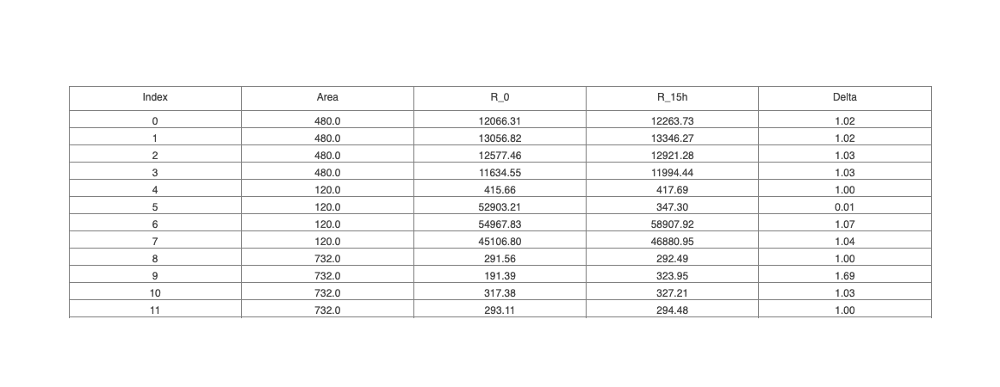

In [17]:
files = ['chf2242tzg_CW20181211B-Ox6-4-preBake-Oz-noBakeIonMill.hdf5', 'chk2050nwb_CW20181211B-Ox6-4-postBake-Oz-noBakeIonMill.hdf5']
minutesBaked = [0, 15*60]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(minutesBaked):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['index'] not in data:
            data[row['index']] = {'area': row['area'],
                                  'r': {m:row['resistance']}}
        else:
            data[row['index']]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][15*60], row['r'][15*60]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_15h', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')

# Wait 3 days after junction liftoff #  
Do the junctions settle over time?

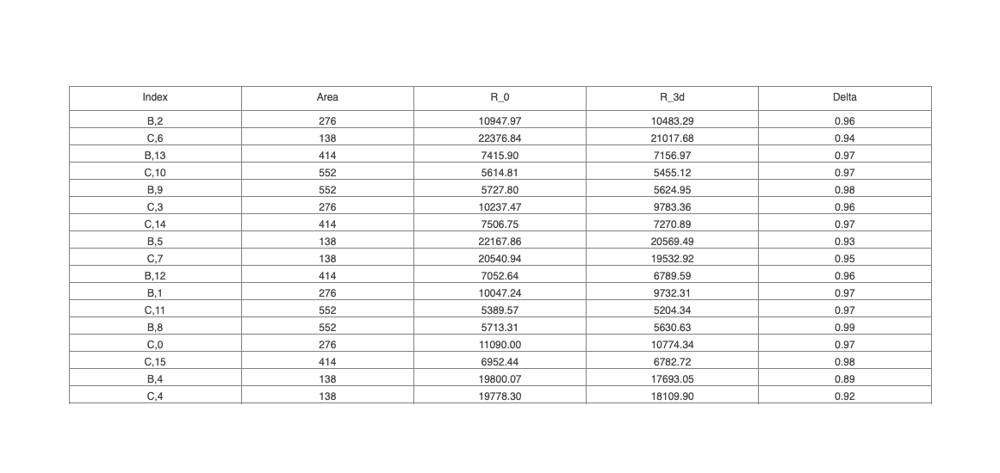

In [13]:
files = ['cka0441oxi_CW20190514A-Ox2.hdf5', 'ckc1632xhn_CW20190514A-Ox2_after3days.hdf5']
daysWaited = [0, 3]

chest = dataChest(['fluxNoise','probe_station'])
dataOrder = ('die', 'index', 'area', 'range', 'resistance')
data = {}
for i,m in enumerate(daysWaited):
    chest.openDataset(files[i])
    later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
    for row in later_data:
        if row['die'][0] in ('B','C'):
            ID = (row['die'][0], row['index'])
            if ID not in data:
                data[ID] = {'area': row['area'],
                                      'r': {m:row['resistance']}}
            else:
                data[ID]['r'][m] = row['resistance']

tableData = [
    [index, row['area']] +
    ['{:.2f}'.format(n) for n in [row['r'][0], 
                                   row['r'][3], row['r'][3]/row['r'][0]]]
    for index,row in data.iteritems()]

#colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Index', 'Area', 'R_0', 'R_3d', 'Delta']),
    cells=dict(values=np.matrix(tableData).T,
                #fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=550))
iplot(fig, filename = 'basic_table')